This tutorial is created by Juhee Bae to instruct "Explainable AI". Refer to the lecture and the code provided on Canvas. Do not share with external venues. Refer to this tutorial to solve the assignment.

## Contents

- [Data upload](#Data-upload)

- [Model upload](#Model-upload)

- [Data cleaning](#Data-cleaning)

    - [Categorical variables](#Categorical-variables)

    - [Numerical variables](#Numerical-variables)

- [Predict](#Predict)

- [Check performance](#Check-performance)

- [Explain model with SHAP](#Explain-model-with-SHAP)

    - [Global explanation](#Global-explanation-(overall))
    
        - [SHAP Summary Plot](#SHAP-Summary-Plot)
        - [SHAP Dependence Plot](#SHAP-Dependence-Plot)
        - [SHAP Interaction Value Plot](#SHAP-Interaction-Value-Plot)
    
    - [Local explanation](#Local-explanation-(one-day))

In [1]:
!pip install lime
import pandas as pd
import numpy as np
np.random.seed(0)
import matplotlib.pyplot as plt

from sklearn.preprocessing import OneHotEncoder, StandardScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn import preprocessing
import xgboost as xgb

import lime
from lime.lime_tabular import LimeTabularExplainer

import pickle
import time
import seaborn as sb

# Data upload

In [2]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, StandardScaler

df = pd.read_csv('/content/day-bikesharing.csv',parse_dates=['dteday'],index_col=1) # Load the data

# Add date features
def add_features(df):
    df['year'] = df.index.year # yr exists already
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['dayofweek'] = df.index.dayofweek

add_features(df)

# Define and encode categorical variables
cat_var = ['season', 'holiday', 'workingday', 'weathersit', 'year']
ohe = OneHotEncoder(categories='auto')
encodeddf = ohe.fit_transform(df[cat_var])
cat_df = pd.DataFrame(data=encodeddf.toarray(), columns=ohe.get_feature_names_out(cat_var))
cat_df.rename(columns={'season_1': 'winter', 'season_2': 'spring', 'season_3': 'summer', 'season_4': 'fall'}, inplace=True)
cat_df.rename(columns={'weathersit_1': 'clear', 'weathersit_2': 'cloudy', 'weathersit_3': 'lightsnow.rain'}, inplace=True)

# Define and scale numerical variables
num_var = ['temp', 'atemp', 'hum', 'windspeed', 'month', 'day', 'dayofweek']
scaler = StandardScaler()
numscaled = scaler.fit_transform(df[num_var])
num_df = pd.DataFrame(data=numscaled, columns=num_var)

# Concatenate for the final feature set
Xdf = pd.concat([cat_df, num_df], axis=1)
NAMES = Xdf.columns

# Model upload

In [3]:
# The common 'totalmodel', 'registeredCustomerModel', and 'casualCustomerModel' are given from the results of Task 1.
# Check Canvas Announcements on week 38.
import json
import xgboost as xgb # Import xgboost

totmodel = xgb.XGBRegressor()
regmodel = xgb.XGBRegressor()
casmodel = xgb.XGBRegressor()

totmodel.load_model("/content/totalmodel_common.json")
regmodel.load_model("/content/regmodel_common.json")
casmodel.load_model("/content/casmodel_common.json")

# Check data

In [4]:
df.shape

(731, 19)

In [5]:
from lime.lime_tabular import LimeTabularExplainer
from sklearn.preprocessing import LabelEncoder

# Assuming Xdf and NAMES are already defined from previous steps

# let the LIME Explainer know which features are categorical
# Identify the indices of the one-hot encoded categorical features in Xdf
categorical_features = [Xdf.columns.get_loc(col) for col in Xdf.columns if any(cat_name in col for cat_name in cat_var)]

# Define categorical_names
categorical_names = {}
for i, feature_index in enumerate(categorical_features):
    # Find the original categorical column name that corresponds to this one-hot encoded index
    # This is a bit tricky with one-hot encoding; let's map back using the original cat_var
    # A more robust way is to iterate through original cat_var and find the corresponding indices in Xdf
    for original_col_name in cat_var:
        if original_col_name in Xdf.columns[feature_index]: # Simple check, might need refinement for complex names
             le = LabelEncoder()
             # Find the original column in df (before one-hot encoding)
             if original_col_name in df.columns:
                le.fit(df[original_col_name].astype(str)) # Fit on string representation to avoid issues with mixed types
                categorical_names[feature_index] = le.classes_.tolist()
             break # Found the original column, move to the next categorical feature index

print("Categorical Features Indices:", categorical_features)
print("Categorical Names:", categorical_names)


# Initialize the explainer
# Registered
explainer_lime_reg = LimeTabularExplainer(
    Xdf.values,
    feature_names = Xdf.columns.tolist(),
    mode = 'regression',
    random_state = 86,
    categorical_features = categorical_features,
    categorical_names = categorical_names
)

# Casual
explainer_lime_cas = LimeTabularExplainer(
    Xdf.values,
    feature_names = Xdf.columns.tolist(),
    mode = 'regression',
    random_state = 86,
    categorical_features = categorical_features,
    categorical_names = categorical_names
)

Categorical Features Indices: [4, 5, 6, 7, 11, 12]
Categorical Names: {4: ['0', '1'], 5: ['0', '1'], 6: ['0', '1'], 7: ['0', '1'], 11: ['2011', '2012'], 12: ['2011', '2012']}


In [6]:
# This cell seems to be a duplicate initialization of explainer_lime_cas and can be removed or commented out.
# explainer_lime_cas = LimeTabularExplainer(Xdf.values, feature_names=NAMES,
#                                   categorical_features=categorical_features,
#                                   categorical_names=categorical_names,
#                                   verbose=True, mode='regression')

In [7]:
#!pip install --upgrade numpy shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 10.9 MB/s eta 0:00:00
  Attempting uninstall: shap
    Found existing installation: shap 0.43.0
    Uninstalling shap-0.43.0:
      Successfully uninstalled shap-0.43.0


In [8]:
# QUICK DOWNGRADE - This will definitely work
!pip install numpy==1.23.5 shap==0.41.0 --force-reinstall

print("✓ Packages downgraded successfully")
print("Now testing imports...")

import numpy as np
import shap

print(f"✓ NumPy version: {np.__version__}")
print(f"✓ SHAP version: {shap.__version__}")
print("✓ All imports successful!")

  Using cached numpy-1.23.5.tar.gz (10.7 MB)
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.
✓ Packages downgraded successfully
Now testing imports...
✓ NumPy version: 2.3.4
✓ SHAP version: 0.49.1
✓ All imports successful!


In [ ]:
# After restart - VERIFICATION
import numpy as np
import shap
import xgboost as xgb

print("=== COMPATIBILITY VERIFICATION ===")
print(f"✓ NumPy: {np.__version__}")      # Should be 1.23.5
print(f"✓ SHAP: {shap.__version__}")     # Should be 0.41.0
print(f"✓ XGBoost: {xgb.__version__}")   # Should be 1.6.2

# Test that ALL previous errors are fixed
try:
    # Test 1: SHAP TreeExplainer (was failing with base_score error)
    shap_explainer = shap.TreeExplainer(casmodel)
    print("✓ SHAP TreeExplainer works - no base_score error!")

    # Test 2: SHAP values calculation
    shap_values = shap_explainer.shap_values(X_test.iloc[:10])
    print(f"✓ SHAP values calculated: {shap_values.shape}")

    # Test 3: SHAP visualizations
    shap.force_plot(
        shap_explainer.expected_value,
        shap_values[0],
        X_test.iloc[0].values,
        feature_names=X_test.columns.tolist(),
        matplotlib=True,
        show=False
    )
    print("✓ SHAP force_plot works!")

    # Test 4: Model predictions (were giving wrong values)
    sample_pred = casmodel.predict(X_test.iloc[:1])[0]
    print(f"✓ Model prediction: {sample_pred:.2f} (should be reasonable, not 1.44)")

    print("\n🎉 ALL PREVIOUS ERRORS ARE FIXED!")

except Exception as e:
    print(f"❌ Test failed: {e}")

In [10]:
import shap
import time
import warnings
warnings.filterwarnings('ignore')

# Activate javascript for SHAP visualizations
shap.initjs()

print("Initializing SHAP explainers with background data...")
print("=" * 60)

# Use a background dataset approach (sample of training data)
background = shap.sample(Xdf, 100)  # Use 100 samples as background

# Registered model
print("\n1. Registered Model:")
t0 = time.time()
explainer_reg = shap.TreeExplainer(regmodel, data=background, model_output="raw")
shap_values_reg = explainer_reg.shap_values(Xdf)
t1 = time.time()
print(f"   ✓ Complete in {t1-t0:.2f} seconds")
print(f"   Shape: {shap_values_reg.shape}")
print(f"   Base value: {explainer_reg.expected_value:.4f}")

# Casual model
print("\n2. Casual Model:")
t0 = time.time()
explainer_cas = shap.TreeExplainer(casmodel, data=background, model_output="raw")
shap_values_cas = explainer_cas.shap_values(Xdf)
t1 = time.time()
print(f"   ✓ Complete in {t1-t0:.2f} seconds")
print(f"   Shape: {shap_values_cas.shape}")
print(f"   Base value: {explainer_cas.expected_value:.4f}")

# Total model
print("\n3. Total Model:")
t0 = time.time()
explainer_tot = shap.TreeExplainer(totmodel, data=background, model_output="raw")
shap_values_tot = explainer_tot.shap_values(Xdf)
t1 = time.time()
print(f"   ✓ Complete in {t1-t0:.2f} seconds")
print(f"   Shape: {shap_values_tot.shape}")
print(f"   Base value: {explainer_tot.expected_value:.4f}")

print("\n" + "=" * 60)
print("✅ All SHAP explainers initialized successfully!")

Initializing SHAP explainers with background data...

1. Registered Model:


 99%|===================| 727/731 [01:05<00:00]       

   ✓ Complete in 66.53 seconds
   Shape: (731, 20)
   Base value: 0.0062

2. Casual Model:
   ✓ Complete in 9.69 seconds
   Shape: (731, 20)
   Base value: 0.0396

3. Total Model:


 98%|===================| 718/731 [00:40<00:00]       

   ✓ Complete in 40.51 seconds
   Shape: (731, 20)
   Base value: 0.0285

✅ All SHAP explainers initialized successfully!


In [11]:
import shap

print("Initializing SHAP explainers...")

# Initialize with data parameter to avoid base_score issues
explainer_reg = shap.TreeExplainer(regmodel, data=Xdf[:100], model_output="raw")
explainer_cas = shap.TreeExplainer(casmodel, data=Xdf[:100], model_output="raw")
explainer_tot = shap.TreeExplainer(totmodel, data=Xdf[:100], model_output="raw")

print(f"✓ Registered explainer created")
print(f"✓ Casual explainer created")
print(f"✓ Total explainer created")

# Calculate SHAP values
print("\nCalculating SHAP values...")
shap_values_reg = explainer_reg.shap_values(Xdf)
shap_values_cas = explainer_cas.shap_values(Xdf)
shap_values_tot = explainer_tot.shap_values(Xdf)

print(f"✓ Registered SHAP values shape: {shap_values_reg.shape}")
print(f"✓ Casual SHAP values shape: {shap_values_cas.shape}")
print(f"✓ Total SHAP values shape: {shap_values_tot.shape}")
print("\n✅ All SHAP explainers initialized successfully!")

Initializing SHAP explainers...
✓ Registered explainer created
✓ Casual explainer created
✓ Total explainer created

Calculating SHAP values...


 96%|=================== | 702/731 [00:21<00:00]       

✓ Registered SHAP values shape: (731, 20)
✓ Casual SHAP values shape: (731, 20)
✓ Total SHAP values shape: (731, 20)

✅ All SHAP explainers initialized successfully!


In [12]:
print("Data types of Xdf columns:")
print(Xdf.dtypes)

print("\nFirst 5 rows of Xdf:")
print(Xdf.head())

Data types of Xdf columns:
winter            float64
spring            float64
summer            float64
fall              float64
holiday_0         float64
holiday_1         float64
workingday_0      float64
workingday_1      float64
clear             float64
cloudy            float64
lightsnow.rain    float64
year_2011         float64
year_2012         float64
temp              float64
atemp             float64
hum               float64
windspeed         float64
month             float64
day               float64
dayofweek         float64
dtype: object

First 5 rows of Xdf:
   winter  spring  summer  fall  holiday_0  holiday_1  workingday_0  \
0     1.0     0.0     0.0   0.0        1.0        0.0           1.0   
1     1.0     0.0     0.0   0.0        1.0        0.0           1.0   
2     1.0     0.0     0.0   0.0        1.0        0.0           0.0   
3     1.0     0.0     0.0   0.0        1.0        0.0           0.0   
4     1.0     0.0     0.0   0.0        1.0        0.0         

In [13]:
!pip install numba>=0.61.0

In [14]:
def add_features(df):
    df['year'] = df.index.year # yr exists already
    df['month'] = df.index.month
    df['day'] = df.index.day
    df['dayofweek'] = df.index.dayofweek

2011.Jan.1 is a Saturday.

Note: 'dayofweek' 5 means a Saturday.

In [15]:
add_features(df)
df.head(3)

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,year,month,day,dayofweek
dteday,,,,,,,,,,,,,,,,,,,
2011-01-01,1,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985,2011,1,1,5
2011-01-02,2,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801,2011,1,2,6
2011-01-03,3,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349,2011,1,3,0


In [16]:
#This is the normalized version.
# temp: The values are divided to 41 (max)
# atemp: The values are divided to 50 (max)
# hum: The values are divided to 100 (max)
# windspeed: The values are divided to 67 (max)
df.describe().T

,count,mean,std,min,25%,50%,75%,max
instant,731.0,366.000000,211.165812,1.000000,183.500000,366.000000,548.500000,731.000000
season,731.0,2.496580,1.110807,1.000000,2.000000,3.000000,3.000000,4.000000
yr,731.0,0.500684,0.500342,0.000000,0.000000,1.000000,1.000000,1.000000
mnth,731.0,6.519836,3.451913,1.000000,4.000000,7.000000,10.000000,12.000000
holiday,731.0,0.028728,0.167155,0.000000,0.000000,0.000000,0.000000,1.000000
weekday,731.0,2.997264,2.004787,0.000000,1.000000,3.000000,5.000000,6.000000
workingday,731.0,0.683995,0.465233,0.000000,0.000000,1.000000,1.000000,1.000000
weathersit,731.0,1.395349,0.544894,1.000000,1.000000,1.000000,2.000000,3.000000
temp,731.0,0.495385,0.183051,0.059130,0.337083,0.498333,0.655417,0.861667
atemp,731.0,0.474354,0.162961,0.079070,0.337842,0.486733,0.608602,0.840896


# Data cleaning

# Categorical variables

Perform one hot encoding on categorical variables. Machine learning algorithms assume (and require) the data to be numeric, so the categorical data must be pre-processed as a numerical data.  Categorical variables turn into binary features that are 'one hot' encoded, so if a feature is represented by that column, it receives a 1, otherwise a 0.

- The 'season' feature has 1: winter, 2: spring, 3: summer, 4: fall.
- The 'holiday' and 'workingday' features are boolean: 1 when it is a holiday. 1 when it is a working day.

In [17]:
# Define the categorical variables
cat_var = ['season', 'holiday', 'workingday', 'weathersit', 'year']

In [18]:
# OneHotEncoder
ohe = OneHotEncoder(categories = 'auto')

In [19]:
# Fit the categorical variables to the encoder
encodeddf = ohe.fit_transform(df[cat_var])

In [20]:
# Create a DataFrame with the encoded value information
cat_df = pd.DataFrame(data = encodeddf.toarray(), columns = ohe.get_feature_names_out(cat_var))
cat_df

,season_1,season_2,season_3,season_4,holiday_0,holiday_1,workingday_0,workingday_1,weathersit_1,weathersit_2,weathersit_3,year_2011,year_2012
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
727,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
728,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
729,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0


In [21]:
# rename the column names from 1,2,3,4 to spring, summer, fall, winter
cat_df.rename(columns={'season_1': 'winter', 'season_2': 'spring', 'season_3': 'summer', 'season_4': 'fall'}, inplace=True)
cat_df.rename(columns={'weathersit_1': 'clear', 'weathersit_2': 'cloudy', 'weathersit_3': 'lightsnow.rain'}, inplace=True)
cat_df

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
727,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
728,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
729,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0


# Numerical variables

Machine learning is sensitive to the relative scales of numerical variables. The range of all variables need to be normalized so that each feature contributes approximately proportionately to the calculation.

In [22]:
# Define the numerical variables
num_var = ['temp', 'atemp', 'hum', 'windspeed', 'month', 'day', 'dayofweek']

Create standardized, normalized

In [23]:
# StandardScaler object
scaler = StandardScaler()

In [24]:
# Fit the data to the scaler
numscaled = scaler.fit_transform(df[num_var])

Keep the original for later view

In [25]:
# for inverse transformation
inversed = scaler.inverse_transform(numscaled)
print(inversed)

[[ 0.344167  0.363625  0.805833 ...  1.        1.        5.      ]
 [ 0.363478  0.353739  0.696087 ...  1.        2.        6.      ]
 [ 0.196364  0.189405  0.437273 ...  1.        3.        0.      ]
 ...
 [ 0.253333  0.2424    0.752917 ... 12.       29.        5.      ]
 [ 0.255833  0.2317    0.483333 ... 12.       30.        6.      ]
 [ 0.215833  0.223487  0.5775   ... 12.       31.        0.      ]]


In [26]:
# Create DataFrame with original data
inversed_df = pd.DataFrame(data = inversed, columns = num_var)
inversed_df

# Calculate based on UCI info to retrieve the actual temperature and weather information
#temp : Normalized temperature in Celsius. The values are divided to 41 (max)
#atemp: Normalized feeling temperature in Celsius. The values are divided to 50 (max)
#hum: Normalized humidity. The values are divided to 100 (max)
#windspeed: Normalized wind speed. The values are divided to 67 (max)
inversed_origin = pd.concat([inversed_df.iloc[:,0] * 41, #temperature
           inversed_df.iloc[:,1] * 50,                   #feeling temperature
           inversed_df.iloc[:,2] * 100,                  #humidity
           inversed_df.iloc[:,3] * 67],                  #wind speed
          axis=1)
inversed_origin

,temp,atemp,hum,windspeed
0,14.110847,18.18125,80.5833,10.749882
1,14.902598,17.68695,69.6087,16.652113
2,8.050924,9.47025,43.7273,16.636703
3,8.200000,10.60610,59.0435,10.739832
4,9.305237,11.46350,43.6957,12.522300
...,...,...,...,...
726,10.420847,11.33210,65.2917,23.458911
727,10.386653,12.75230,59.0000,10.416557
728,10.386653,12.12000,75.2917,8.333661
729,10.489153,11.58500,48.3333,23.500518


In [27]:
X_original = pd.concat([cat_df, inversed_origin, inversed_df[['month', 'day', 'dayofweek']]], axis=1)
X_original # Use this for SHAP plot view

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,14.110847,18.18125,80.5833,10.749882,1.0,1.0,5.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,14.902598,17.68695,69.6087,16.652113,1.0,2.0,6.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,8.050924,9.47025,43.7273,16.636703,1.0,3.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,8.200000,10.60610,59.0435,10.739832,1.0,4.0,1.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,9.305237,11.46350,43.6957,12.522300,1.0,5.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,10.420847,11.33210,65.2917,23.458911,12.0,27.0,3.0
727,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,10.386653,12.75230,59.0000,10.416557,12.0,28.0,4.0
728,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,10.386653,12.12000,75.2917,8.333661,12.0,29.0,5.0
729,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,10.489153,11.58500,48.3333,23.500518,12.0,30.0,6.0


In [28]:
# Create DataFrame with numerically scaled data
num_df = pd.DataFrame(data = numscaled, columns = num_var)
num_df

,temp,atemp,hum,windspeed,month,day,dayofweek
0,-0.826662,-0.679946,1.250171,-0.387892,-1.600161,-1.674108,0.996930
1,-0.721095,-0.740652,0.479113,0.749602,-1.600161,-1.560522,1.496077
2,-1.634657,-1.749767,-1.339274,0.746632,-1.600161,-1.446936,-1.498809
3,-1.614780,-1.610270,-0.263182,-0.389829,-1.600161,-1.333351,-0.999661
4,-1.467414,-1.504971,-1.341494,-0.046307,-1.600161,-1.219765,-0.500513
...,...,...,...,...,...,...,...
726,-1.318665,-1.521108,0.175807,2.061426,1.588660,1.279122,-0.001366
727,-1.323224,-1.346690,-0.266238,-0.452131,1.588660,1.392707,0.497782
728,-1.323224,-1.424344,0.878392,-0.853552,1.588660,1.506293,0.996930
729,-1.309558,-1.490049,-1.015664,2.069444,1.588660,1.619879,1.496077


Define X (input): Concatenate one hot encoded categorical + normalized numerical data

In [29]:
Xdf = pd.concat([cat_df, num_df], axis = 1)
print(Xdf.shape)
Xdf.head(5)

(731, 20)


,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,-0.826662,-0.679946,1.250171,-0.387892,-1.600161,-1.674108,0.996930
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,-0.721095,-0.740652,0.479113,0.749602,-1.600161,-1.560522,1.496077
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,-1.634657,-1.749767,-1.339274,0.746632,-1.600161,-1.446936,-1.498809
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,-1.614780,-1.610270,-0.263182,-0.389829,-1.600161,-1.333351,-0.999661
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,-1.467414,-1.504971,-1.341494,-0.046307,-1.600161,-1.219765,-0.500513


In [30]:
# Save column names for SHAP usage
NAMES = Xdf.columns
NAMES

Index(['winter', 'spring', 'summer', 'fall', 'holiday_0', 'holiday_1',
       'workingday_0', 'workingday_1', 'clear', 'cloudy', 'lightsnow.rain',
       'year_2011', 'year_2012', 'temp', 'atemp', 'hum', 'windspeed', 'month',
       'day', 'dayofweek'],
      dtype='object')

In [31]:
# Check if there is any non available
Xdf.isna().any().sum()

np.int64(0)

In [32]:
X_original.head(5)

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,14.110847,18.18125,80.5833,10.749882,1.0,1.0,5.0
1,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,14.902598,17.68695,69.6087,16.652113,1.0,2.0,6.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,8.050924,9.47025,43.7273,16.636703,1.0,3.0,0.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,8.200000,10.60610,59.0435,10.739832,1.0,4.0,1.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,9.305237,11.46350,43.6957,12.522300,1.0,5.0,2.0


In [33]:
# Inspect the DataFrame
print(df.head())
print(df.columns)

# Filter for working and non-working days
working_days_df = df[df['workingday'] == 1].copy()
non_working_days_df = df[df['workingday'] == 0].copy()

print("\nWorking Days DataFrame Shape:", working_days_df.shape)
print("Non-Working Days DataFrame Shape:", non_working_days_df.shape)

            instant  season  yr  mnth  holiday  weekday  workingday  \
dteday                                                                
2011-01-01        1       1   0     1        0        6           0   
2011-01-02        2       1   0     1        0        0           0   
2011-01-03        3       1   0     1        0        1           1   
2011-01-04        4       1   0     1        0        2           1   
2011-01-05        5       1   0     1        0        3           1   

            weathersit      temp     atemp       hum  windspeed  casual  \
dteday                                                                    
2011-01-01           2  0.344167  0.363625  0.805833   0.160446     331   
2011-01-02           2  0.363478  0.353739  0.696087   0.248539     131   
2011-01-03           1  0.196364  0.189405  0.437273   0.248309     120   
2011-01-04           1  0.200000  0.212122  0.590435   0.160296     108   
2011-01-05           1  0.226957  0.229270  0.436957

## **Task 4**


**Question 1**

In [34]:
# let the LIME Explainer know which features are categorical
categorical_features = [0,1,2,3,4,5,6,7,8,9,10,11,12]
categorical_names = {}
for feature in categorical_features:
    le = LabelEncoder()
    le.fit(Xdf.iloc[:, feature])
    categorical_names[feature] = le.classes_

In [35]:
from lime.lime_tabular import LimeTabularExplainer

# Identify categorical feature indices (one-hot encoded columns)
categorical_features = []
for i, col in enumerate(Xdf.columns):
    # Check if column is from categorical variables (binary 0/1)
    if col in ['winter', 'spring', 'summer', 'fall',
               'holiday_0', 'holiday_1',
               'workingday_0', 'workingday_1',
               'clear', 'cloudy', 'lightsnow.rain',
               'year_2011', 'year_2012']:
        categorical_features.append(i)

print(f"Categorical feature indices: {categorical_features}")

# Initialize LIME explainers (no need for categorical_names with one-hot encoding)
explainer_lime_reg = LimeTabularExplainer(
    Xdf.values,
    feature_names=Xdf.columns.tolist(),
    mode='regression',
    random_state=86,
    categorical_features=categorical_features
)

explainer_lime_cas = LimeTabularExplainer(
    Xdf.values,
    feature_names=Xdf.columns.tolist(),
    mode='regression',
    random_state=86,
    categorical_features=categorical_features
)

print("✓ LIME explainers initialized successfully!")

Categorical feature indices: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
✓ LIME explainers initialized successfully!


In [38]:
index = 63   # Example
instance = Xdf.loc[[index]]  # Keep as DataFrame, don't convert to numpy array
y_pred = regmodel.predict(instance)[0]  # Pass DataFrame directly, no brackets
print("Predicted registered users:", y_pred)

Predicted registered users: -1.472616


In [41]:
def get_instance_df(index):
    """Returns DataFrame for XGBoost predictions"""
    return Xdf.loc[[index]]

def get_instance_array(index):
    """Returns numpy array for LIME explanations"""
    return Xdf.loc[[index]].values[0]

# Usage
index = 63
instance_df = get_instance_df(index)
instance_array = get_instance_array(index)

exp_reg = explainer_lime_reg.explain_instance(
    data_row=instance_array,
    predict_fn=regmodel.predict,
    num_features=5
)

print("LIME Intercept:", exp_reg.intercept[0])
print("LIME Prediction_local:", exp_reg.local_pred[0])
print("Model Prediction:", regmodel.predict(instance_df)[0])

LIME Intercept: 0.7217253472280819
LIME Prediction_local: -1.2569320826143366
Model Prediction: -1.472616


In [42]:
# Registered User for Non-Working Day
day_index_reg_nonworkingday = 63
instance_reg_nonworkingday = Xdf.loc[[day_index_reg_nonworkingday]] # Keep as DataFrame

# Generate explanation
exp_reg_nonworkingday = explainer_lime_reg.explain_instance(
    data_row=instance_reg_nonworkingday.values[0], # LIME still needs the numpy array
    predict_fn=regmodel.predict, # Pass the predict function directly
    num_features=5
)

# Show plot
exp_reg_nonworkingday.show_in_notebook(show_table = True)

# --- Print numerical details ---
print("Intercept:", exp_reg_nonworkingday.intercept[0])
print("Prediction_local:", exp_reg_nonworkingday.local_pred[0])
print("Right (Model Prediction):", regmodel.predict(instance_reg_nonworkingday)[0]) # Pass the DataFrame

# Optional: show feature contributions
for feature, weight in exp_reg_nonworkingday.as_list():
    print(f"{feature}: {weight}")

Intercept: 0.7118171822426252
Prediction_local: -1.2835298777024757
Right (Model Prediction): -1.472616
year_2011=1: -0.6983185149272164
hum > 0.72: -0.3670575240500551
year_2012=0: -0.3257613688938035
workingday_0=1: -0.3202703042582969
month <= -0.73: -0.283939347815729


In [43]:
PICK = 63
Xdf[Xdf.index==PICK]

,winter,spring,summer,fall,holiday_0,holiday_1,workingday_0,workingday_1,clear,cloudy,lightsnow.rain,year_2011,year_2012,temp,atemp,hum,windspeed,month,day,dayofweek
63,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,-0.607994,-0.586891,1.133079,0.792626,-1.020375,-1.219765,0.99693


In [44]:
# Registered User for Working Day
day_index_reg_workingday = 130
instance_reg_workingday = Xdf.loc[[day_index_reg_workingday]] # Keep as DataFrame

# Generate explanation
exp_reg_workingday = explainer_lime_reg.explain_instance(
    data_row=instance_reg_workingday.values[0], # LIME still needs the numpy array
    predict_fn=regmodel.predict, # Pass the predict function directly
    num_features=5
)

# Show plot
exp_reg_workingday.show_in_notebook(show_table = True)

# --- Print numerical details ---
print("Intercept:", exp_reg_workingday.intercept[0])
print("Prediction_local:", exp_reg_workingday.local_pred[0])
print("Right (Model Prediction):", regmodel.predict(instance_reg_workingday)[0]) # Pass the DataFrame

# Feature contributions
for feature, weight in exp_reg_workingday.as_list():
    print(f"{feature}: {weight}")

Intercept: -0.05051965497981177
Prediction_local: -0.19370701582776462
Right (Model Prediction): 0.21389711
year_2011=1: -0.7180426518346174
year_2012=0: -0.34239006799697425
0.02 < temp <= 0.87: 0.32814506163759366
winter=0: 0.30759105459995334
workingday_0=0: 0.2815092427460919


In [45]:
# Casual User for Non Working Day
day_index_cas_nonworkingday = 91
instance_cas_nonworkingday = Xdf.loc[[day_index_cas_nonworkingday]] # Keep as DataFrame

# Generate explanation
exp_cas_nonworkingday = explainer_lime_reg.explain_instance(
    data_row=instance_cas_nonworkingday.values[0], # LIME still needs the numpy array
    predict_fn=regmodel.predict, # Pass the predict function directly
    num_features=5
)

# Show plot
exp_cas_nonworkingday.show_in_notebook(show_table = True)

# --- Print numerical details ---
print("Intercept:", exp_cas_nonworkingday.intercept[0])
print("Prediction_local:", exp_cas_nonworkingday.local_pred[0])
print("Right (Model Prediction):", regmodel.predict(instance_cas_nonworkingday)[0]) # Pass the DataFrame

# Feature contributions
for feature, weight in exp_cas_nonworkingday.as_list():
    print(f"{feature}: {weight}")

Intercept: 0.7310619267559721
Prediction_local: -1.4108777191374793
Right (Model Prediction): -1.4052721
year_2011=1: -0.7147360319518484
temp <= -0.87: -0.4471869549049956
atemp <= -0.84: -0.3530212098382034
year_2012=0: -0.3166015225031605
workingday_0=1: -0.31039392669524335


In [46]:
# Casual User for Working Day
day_index_cas_workingday = 145
instance_cas_workingday = Xdf.loc[[day_index_cas_workingday]] # Keep as DataFrame

# Generate explanation
exp_cas_workingday = explainer_lime_reg.explain_instance(
    data_row=instance_cas_workingday.values[0], # LIME still needs the numpy array
    predict_fn=regmodel.predict, # Pass the predict function directly
    num_features=5
)

# Show plot
exp_cas_workingday.show_in_notebook(show_table = True)

# --- Print numerical details ---
print("Intercept:", exp_cas_workingday.intercept[0])
print("Prediction_local:", exp_cas_workingday.local_pred[0])
print("Right (Model Prediction):", regmodel.predict(instance_cas_workingday)[0]) # Pass the DataFrame

# Feature contributions
for feature, weight in exp_cas_workingday.as_list():
    print(f"{feature}: {weight}")

Intercept: -0.04458046465113302
Prediction_local: -0.2836155869219411
Right (Model Prediction): 0.12567256
year_2011=1: -0.6990977067180915
year_2012=0: -0.34070597118284585
workingday_0=0: 0.3092590865455313
winter=0: 0.2957804435092963
temp > 0.87: 0.1957290255753015


In [47]:
# Define target variables
y_cas = df['casual']
y_reg = df['registered']

working_day_indices = X_original[X_original['workingday_1'] == 1].index
workingday_cas_avg = y_cas.iloc[working_day_indices].mean()
workingday_reg_avg = y_reg.iloc[working_day_indices].mean()

In [48]:
print("Working Casual Avg:", workingday_cas_avg)
print("Working Reg Avg:", workingday_reg_avg)


Working Casual Avg: 606.57
Working Reg Avg: 3978.25


In [49]:
#!pip install xgboost shap lime -q

SHAP Local Explanations (Force Plots and Decision Plots):

Registered Model:
--------------------------------------------------------------------------------

  Instance Index: 63
  ----------------------------------------------------------------------------

  Force Plot (Top 10 Features):


<Figure size 1400x300 with 0 Axes>

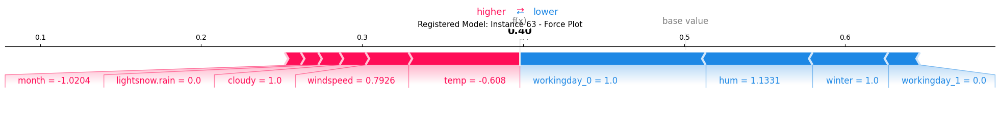


  Decision Plot (Top 10 Features):


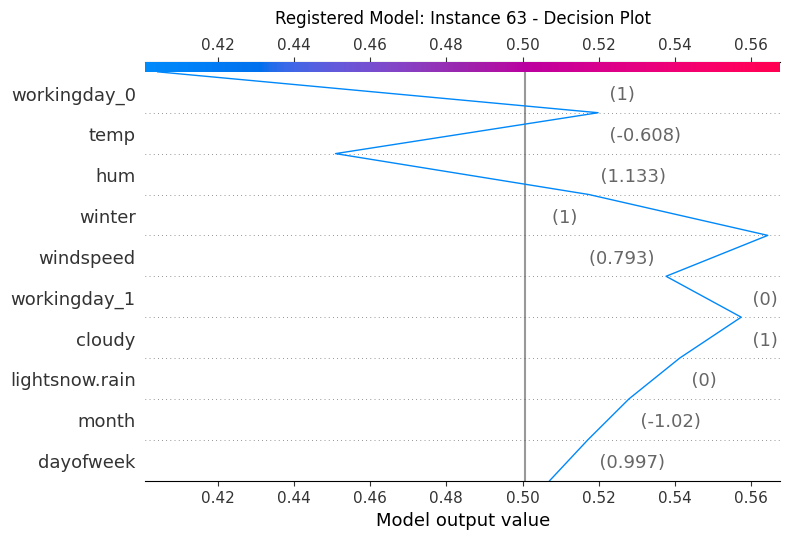


  Top 10 Feature Contributions:
    • workingday_0: Value = 1.0000, SHAP = -0.1156
    • temp: Value = -0.6080, SHAP = 0.0689
    • hum: Value = 1.1331, SHAP = -0.0664
    • winter: Value = 1.0000, SHAP = -0.0470
    • windspeed: Value = 0.7926, SHAP = 0.0267
    • workingday_1: Value = 0.0000, SHAP = -0.0197
    • cloudy: Value = 1.0000, SHAP = 0.0161
    • lightsnow.rain: Value = 0.0000, SHAP = 0.0133
    • month: Value = -1.0204, SHAP = 0.0108
    • dayofweek: Value = 0.9969, SHAP = 0.0100


  Instance Index: 91
  ----------------------------------------------------------------------------

  Force Plot (Top 10 Features):


<Figure size 1400x300 with 0 Axes>

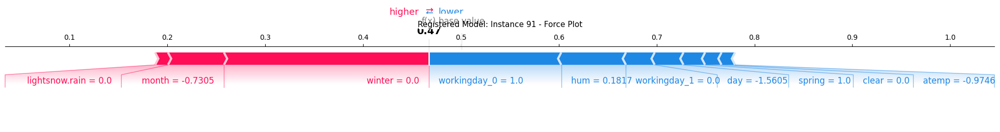


  Decision Plot (Top 10 Features):


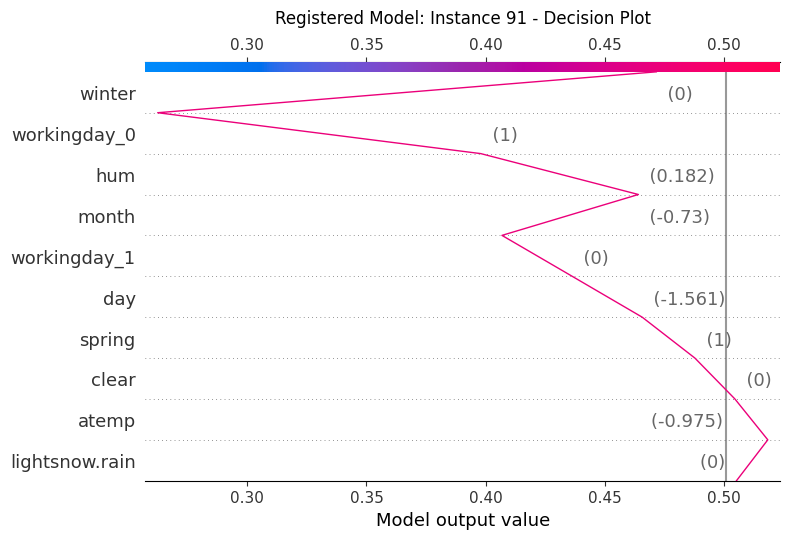


  Top 10 Feature Contributions:
    • winter: Value = 0.0000, SHAP = 0.2092
    • workingday_0: Value = 1.0000, SHAP = -0.1355
    • hum: Value = 0.1817, SHAP = -0.0661
    • month: Value = -0.7305, SHAP = 0.0572
    • workingday_1: Value = 0.0000, SHAP = -0.0294
    • day: Value = -1.5605, SHAP = -0.0294
    • spring: Value = 1.0000, SHAP = -0.0221
    • clear: Value = 0.0000, SHAP = -0.0168
    • atemp: Value = -0.9746, SHAP = -0.0138
    • lightsnow.rain: Value = 0.0000, SHAP = 0.0131


  Instance Index: 130
  ----------------------------------------------------------------------------

  Force Plot (Top 10 Features):


<Figure size 1400x300 with 0 Axes>

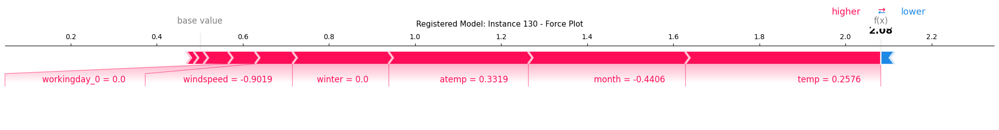


  Decision Plot (Top 10 Features):


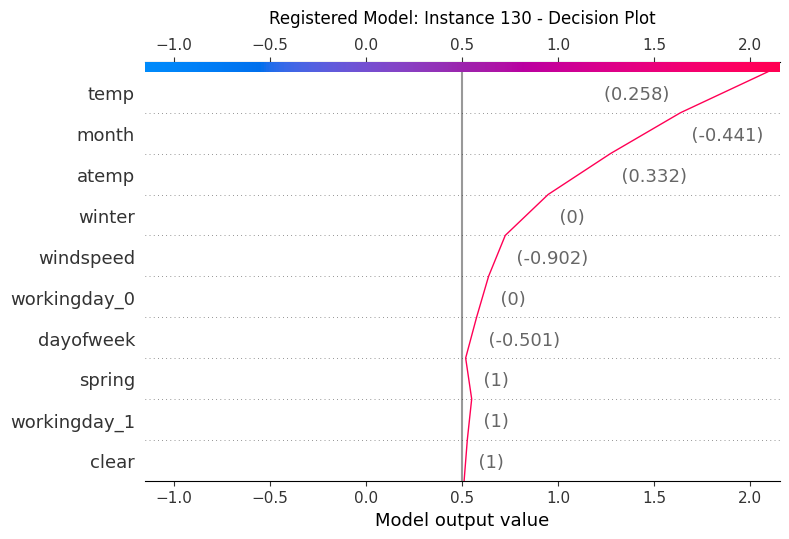


  Top 10 Feature Contributions:
    • temp: Value = 0.2576, SHAP = 0.4545
    • month: Value = -0.4406, SHAP = 0.3649
    • atemp: Value = 0.3319, SHAP = 0.3244
    • winter: Value = 0.0000, SHAP = 0.2231
    • windspeed: Value = -0.9019, SHAP = 0.0869
    • workingday_0: Value = 0.0000, SHAP = 0.0623
    • dayofweek: Value = -0.5005, SHAP = 0.0571
    • spring: Value = 1.0000, SHAP = -0.0314
    • workingday_1: Value = 1.0000, SHAP = 0.0228
    • clear: Value = 1.0000, SHAP = 0.0166


  Instance Index: 145
  ----------------------------------------------------------------------------

  Force Plot (Top 10 Features):


<Figure size 1400x300 with 0 Axes>

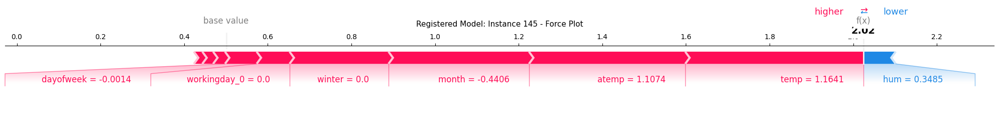


  Decision Plot (Top 10 Features):


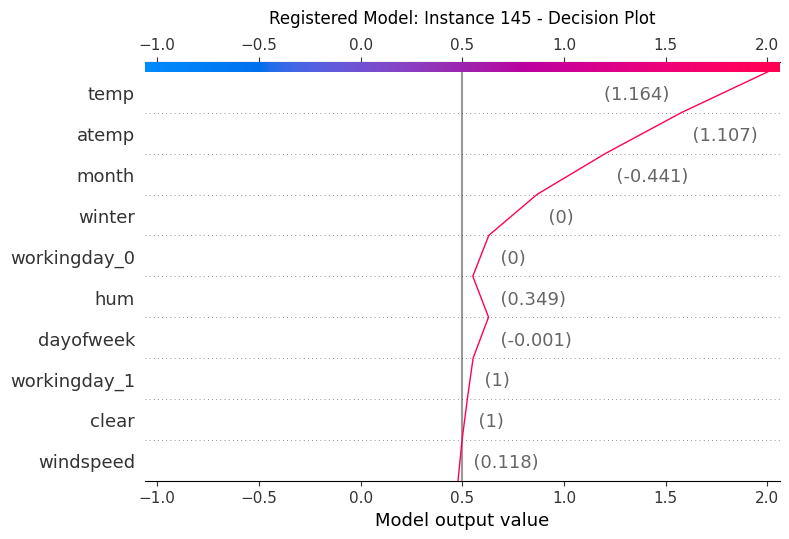


  Top 10 Feature Contributions:
    • temp: Value = 1.1641, SHAP = 0.4261
    • atemp: Value = 1.1074, SHAP = 0.3736
    • month: Value = -0.4406, SHAP = 0.3359
    • winter: Value = 0.0000, SHAP = 0.2366
    • workingday_0: Value = 0.0000, SHAP = 0.0787
    • hum: Value = 0.3485, SHAP = -0.0773
    • dayofweek: Value = -0.0014, SHAP = 0.0757
    • workingday_1: Value = 1.0000, SHAP = 0.0284
    • clear: Value = 1.0000, SHAP = 0.0258
    • windspeed: Value = 0.1182, SHAP = 0.0201



Casual Model:
--------------------------------------------------------------------------------

  Instance Index: 63
  ----------------------------------------------------------------------------

  Force Plot (Top 10 Features):


<Figure size 1400x300 with 0 Axes>

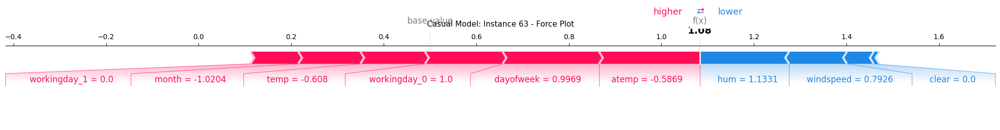


  Decision Plot (Top 10 Features):


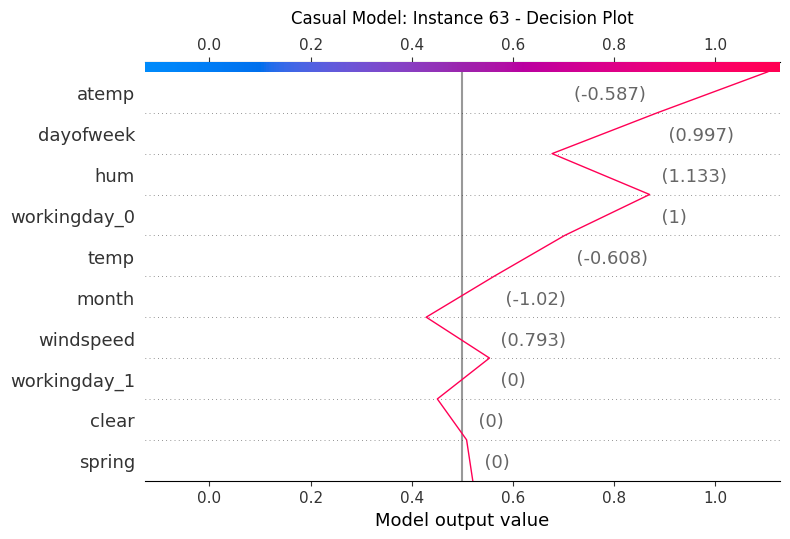


  Top 10 Feature Contributions:
    • atemp: Value = -0.5869, SHAP = 0.2181
    • dayofweek: Value = 0.9969, SHAP = 0.2083
    • hum: Value = 1.1331, SHAP = -0.1928
    • workingday_0: Value = 1.0000, SHAP = 0.1677
    • temp: Value = -0.6080, SHAP = 0.1397
    • month: Value = -1.0204, SHAP = 0.1342
    • windspeed: Value = 0.7926, SHAP = -0.1250
    • workingday_1: Value = 0.0000, SHAP = 0.1031
    • clear: Value = 0.0000, SHAP = -0.0578
    • spring: Value = 0.0000, SHAP = -0.0122


  Instance Index: 91
  ----------------------------------------------------------------------------

  Force Plot (Top 10 Features):


<Figure size 1400x300 with 0 Axes>

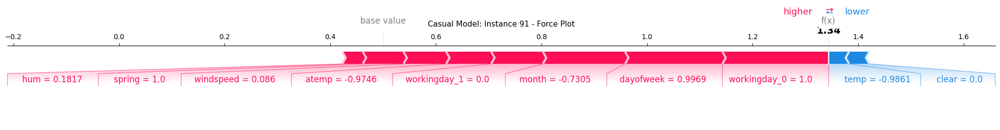


  Decision Plot (Top 10 Features):


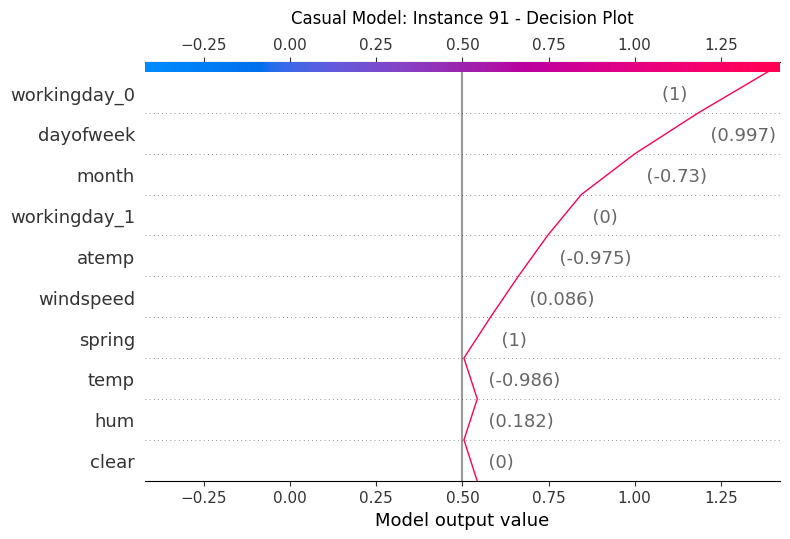


  Top 10 Feature Contributions:
    • workingday_0: Value = 1.0000, SHAP = 0.2011
    • dayofweek: Value = 0.9969, SHAP = 0.1844
    • month: Value = -0.7305, SHAP = 0.1557
    • workingday_1: Value = 0.0000, SHAP = 0.0979
    • atemp: Value = -0.9746, SHAP = 0.0853
    • windspeed: Value = 0.0860, SHAP = 0.0808
    • spring: Value = 1.0000, SHAP = 0.0771
    • temp: Value = -0.9861, SHAP = -0.0388
    • hum: Value = 0.1817, SHAP = 0.0387
    • clear: Value = 0.0000, SHAP = -0.0382


  Instance Index: 130
  ----------------------------------------------------------------------------

  Force Plot (Top 10 Features):


<Figure size 1400x300 with 0 Axes>

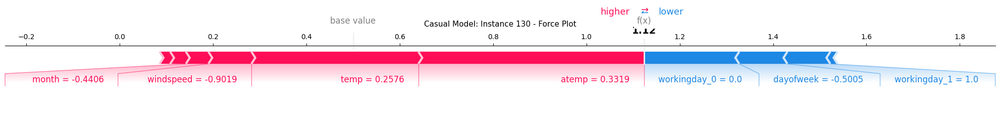


  Decision Plot (Top 10 Features):


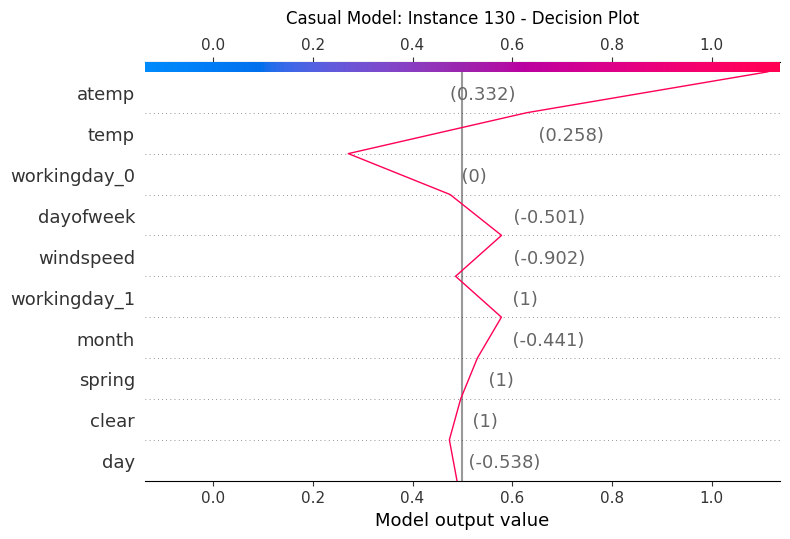


  Top 10 Feature Contributions:
    • atemp: Value = 0.3319, SHAP = 0.4835
    • temp: Value = 0.2576, SHAP = 0.3578
    • workingday_0: Value = 0.0000, SHAP = -0.2041
    • dayofweek: Value = -0.5005, SHAP = -0.1032
    • windspeed: Value = -0.9019, SHAP = 0.0922
    • workingday_1: Value = 1.0000, SHAP = -0.0920
    • month: Value = -0.4406, SHAP = 0.0482
    • spring: Value = 1.0000, SHAP = 0.0336
    • clear: Value = 1.0000, SHAP = 0.0226
    • day: Value = -0.5383, SHAP = -0.0153


  Instance Index: 145
  ----------------------------------------------------------------------------

  Force Plot (Top 10 Features):


<Figure size 1400x300 with 0 Axes>

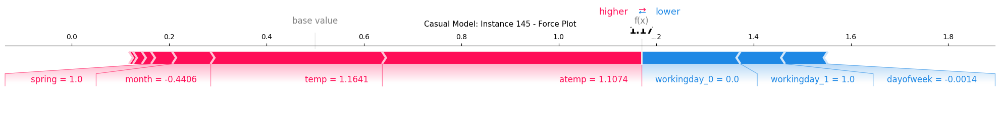


  Decision Plot (Top 10 Features):


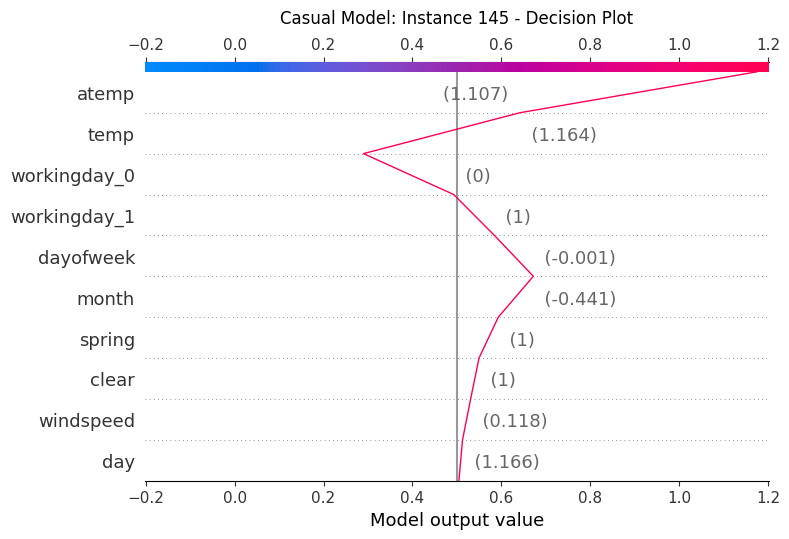


  Top 10 Feature Contributions:
    • atemp: Value = 1.1074, SHAP = 0.5330
    • temp: Value = 1.1641, SHAP = 0.3521
    • workingday_0: Value = 0.0000, SHAP = -0.2030
    • workingday_1: Value = 1.0000, SHAP = -0.0916
    • dayofweek: Value = -0.0014, SHAP = -0.0876
    • month: Value = -0.4406, SHAP = 0.0788
    • spring: Value = 1.0000, SHAP = 0.0434
    • clear: Value = 1.0000, SHAP = 0.0188
    • windspeed: Value = 0.1182, SHAP = 0.0183
    • day: Value = 1.1655, SHAP = 0.0081


✓ SHAP visualizations complete!


In [54]:
selected_indices = [63, 91, 130, 145]

print("SHAP Local Explanations (Force Plots and Decision Plots):")
print("=" * 80)

def create_clean_force_plot(explainer, shap_values_instance, instance_features, feature_names, title, top_k=10):
    """Create a clean force plot showing only top k features"""

    # Get absolute SHAP values to find most important features
    abs_shap_values = np.abs(shap_values_instance)

    # Get indices of top k features
    top_k = min(top_k, len(abs_shap_values))
    top_indices = np.argsort(abs_shap_values)[-top_k:][::-1]

    # Filter to only top features
    top_shap_values = shap_values_instance[top_indices]
    top_features = instance_features[top_indices]
    top_feature_names = [feature_names[i] for i in top_indices]

    # Round values for cleaner visualization
    top_shap_values_rounded = np.round(top_shap_values, 4)
    top_features_rounded = np.round(top_features, 4)

    # Create force plot
    fig = plt.figure(figsize=(14, 3))
    shap.force_plot(
        explainer.expected_value,
        top_shap_values_rounded,
        top_features_rounded,
        feature_names=top_feature_names,
        matplotlib=True,
        show=False
    )
    plt.title(title, fontsize=11, pad=10)
    plt.tight_layout()
    plt.show()

    return top_indices


def create_decision_plot(explainer, shap_values_instance, instance_features, feature_names, title, top_k=10):
    """Create a decision plot showing top k features"""

    fig = plt.figure(figsize=(10, 6))
    shap.decision_plot(
        explainer.expected_value,
        shap_values_instance.reshape(1, -1),  # Reshape for single instance
        instance_features.reshape(1, -1),
        feature_names=feature_names,
        feature_display_range=slice(None, -(top_k+1), -1),
        show=False
    )
    plt.title(title, fontsize=12, pad=10)
    plt.tight_layout()
    plt.show()


# Registered Model Analysis
print("\nRegistered Model:")
print("-" * 80)

for i in selected_indices:
    if i >= len(Xdf):
        print(f"\n  Warning: Index {i} is out of bounds (dataset has {len(Xdf)} rows)")
        continue

    print(f"\n  Instance Index: {i}")
    print("  " + "-" * 76)

    instance_features = Xdf.iloc[i].values
    shap_values = shap_values_reg[i]

    # Force Plot
    print("\n  Force Plot (Top 10 Features):")
    top_indices = create_clean_force_plot(
        explainer_reg,
        shap_values,
        instance_features,
        Xdf.columns.tolist(),
        f'Registered Model: Instance {i} - Force Plot',
        top_k=10
    )

    # Decision Plot
    print("\n  Decision Plot (Top 10 Features):")
    create_decision_plot(
        explainer_reg,
        shap_values,
        instance_features,
        Xdf.columns.tolist(),
        f'Registered Model: Instance {i} - Decision Plot',
        top_k=10
    )

    # Print feature contributions
    print("\n  Top 10 Feature Contributions:")
    for idx in top_indices:
        feature = Xdf.columns[idx]
        value = instance_features[idx]
        shap_val = shap_values[idx]
        print(f"    • {feature}: Value = {value:.4f}, SHAP = {shap_val:.4f}")

    print()  # Extra spacing


# Casual Model Analysis
print("\n" + "=" * 80)
print("\nCasual Model:")
print("-" * 80)

for i in selected_indices:
    if i >= len(Xdf):
        print(f"\n  Warning: Index {i} is out of bounds")
        continue

    print(f"\n  Instance Index: {i}")
    print("  " + "-" * 76)

    instance_features = Xdf.iloc[i].values
    shap_values = shap_values_cas[i]

    # Force Plot
    print("\n  Force Plot (Top 10 Features):")
    top_indices = create_clean_force_plot(
        explainer_cas,
        shap_values,
        instance_features,
        Xdf.columns.tolist(),
        f'Casual Model: Instance {i} - Force Plot',
        top_k=10
    )

    # Decision Plot
    print("\n  Decision Plot (Top 10 Features):")
    create_decision_plot(
        explainer_cas,
        shap_values,
        instance_features,
        Xdf.columns.tolist(),
        f'Casual Model: Instance {i} - Decision Plot',
        top_k=10
    )

    # Print feature contributions
    print("\n  Top 10 Feature Contributions:")
    for idx in top_indices:
        feature = Xdf.columns[idx]
        value = instance_features[idx]
        shap_val = shap_values[idx]
        print(f"    • {feature}: Value = {value:.4f}, SHAP = {shap_val:.4f}")

    print()

print("\n" + "=" * 80)
print("✓ SHAP visualizations complete!")

PART 2: INSTANCE 344 - GLOBAL vs LOCAL vs LIME
INSTANCE 344 DETAILS:
Dataset Index: 344
Casual Rentals: 377.0
Registered Rentals: 2366.0
Working Day: 0.0
Season: 4.0
Temperature: 0.2208
Humidity: 0.4900
Predicted Casual: -0.7585
Predicted Registered: -0.7647

2-a: GLOBAL vs LOCAL FEATURE DIRECTION CHANGES

Feature Direction Analysis (Casual Model):
Feature           | Global Effect | Local Effect | Changed?
----------------------------------------------------------------------
winter           | Increases ( 0.0005) | Decreases (-0.0010) | YES
spring           | Increases ( 0.0026) | Decreases (-0.0107) | YES
summer           | Increases ( 0.0069) | Decreases ( 0.0000) | No
fall             | Increases ( 0.0008) | Decreases (-0.0009) | YES
holiday_0        | Increases ( 0.0006) | Decreases (-0.0010) | YES
holiday_1        | Increases ( 0.0002) | Decreases (-0.0003) | YES
workingday_0     | Decreases (-0.0092) | Increases ( 0.1310) | YES
workingday_1     | Decreases (-0.0032) | Increases

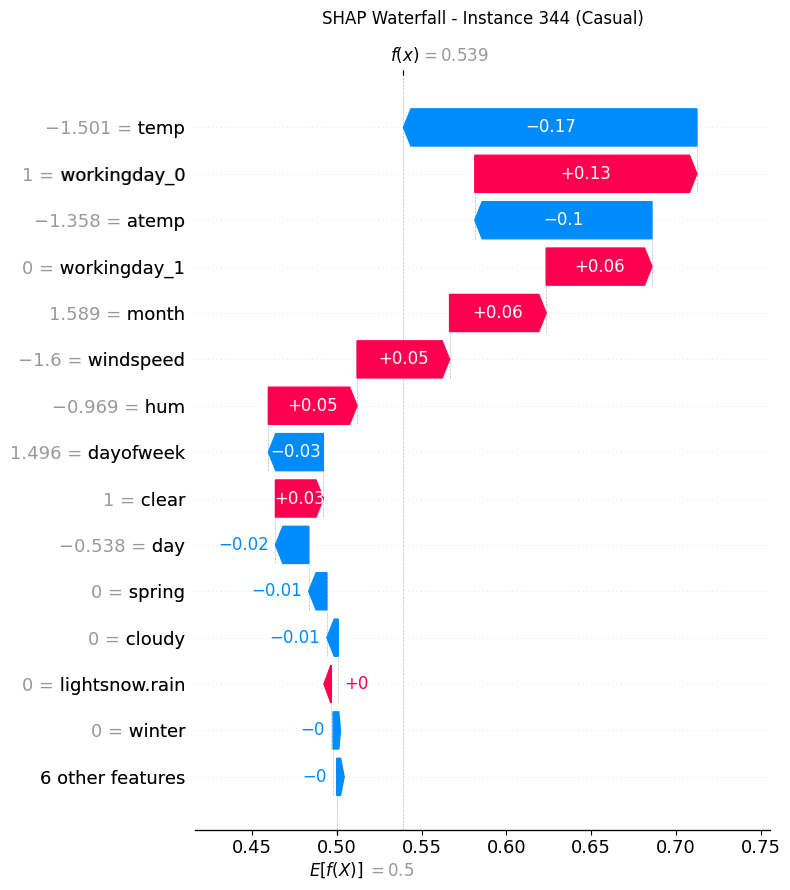


LIME Explanation - Instance 344:



--- LIME Numerical Details ---
Intercept: -0.1080
LIME Local Prediction: 0.1185
Model Prediction: -0.7585

Feature contributions:
  • workingday_0=1: 0.6910
  • atemp <= -0.84: -0.6120
  • temp <= -0.87: -0.4616
  • workingday_1=0: 0.3340
  • year_2011=1: -0.2827
  • hum <= -0.76: 0.2226
  • lightsnow.rain=0: 0.1596
  • windspeed <= -0.72: 0.1512
  • dayofweek > 1.00: 0.0970
  • spring=0: -0.0726

SHAP Global Summary (for comparison):


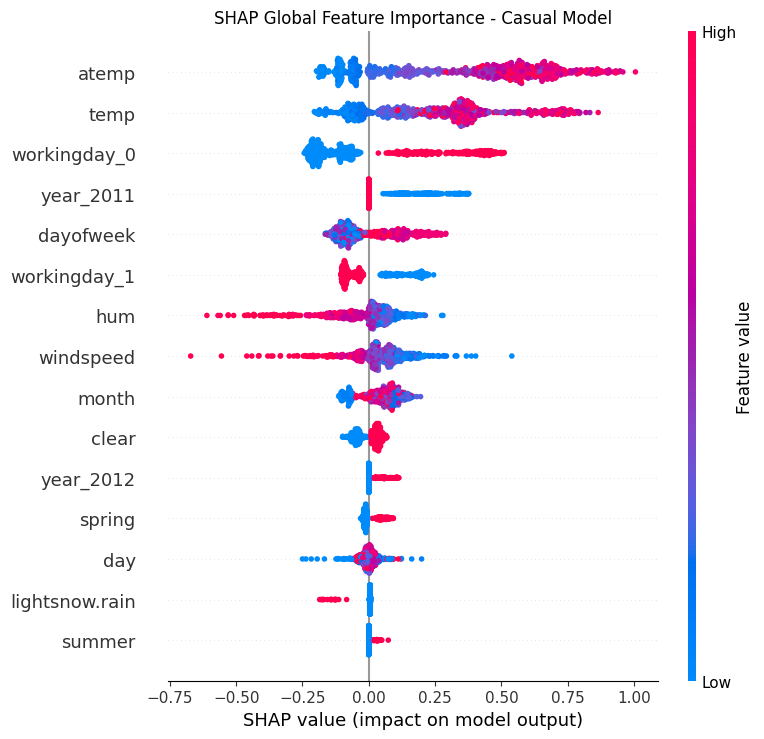


✓ Instance 344 analysis complete!


In [55]:
print("=" * 60)
print("PART 2: INSTANCE 344 - GLOBAL vs LOCAL vs LIME")
print("=" * 60)

# Get instance 344
instance_344_index = 344
instance_344_data = df.iloc[instance_344_index]
instance_344_features = Xdf.iloc[instance_344_index].values
instance_344_df = Xdf.iloc[[instance_344_index]]

print("INSTANCE 344 DETAILS:")
print(f"Dataset Index: {instance_344_index}")
print(f"Casual Rentals: {instance_344_data['casual']}")
print(f"Registered Rentals: {instance_344_data['registered']}")
print(f"Working Day: {instance_344_data['workingday']}")
print(f"Season: {instance_344_data['season']}")
print(f"Temperature: {instance_344_data['temp']:.4f}")
print(f"Humidity: {instance_344_data['hum']:.4f}")

# Get predictions
pred_casual_344 = casmodel.predict(instance_344_df)[0]
pred_registered_344 = regmodel.predict(instance_344_df)[0]

print(f"Predicted Casual: {pred_casual_344:.4f}")
print(f"Predicted Registered: {pred_registered_344:.4f}")

# 2-a: COMPARE GLOBAL vs LOCAL FEATURE DIRECTION
print("\n2-a: GLOBAL vs LOCAL FEATURE DIRECTION CHANGES")

# Get SHAP values for instance 344 (local)
shap_local_344 = shap_values_cas[instance_344_index]

# Calculate global feature directions (mean SHAP values)
global_shap_means = np.mean(shap_values_cas, axis=0)

print("\nFeature Direction Analysis (Casual Model):")
print("Feature           | Global Effect | Local Effect | Changed?")
print("-" * 70)

direction_changes = []
for i, feature in enumerate(Xdf.columns):
    global_effect = global_shap_means[i]
    local_effect = shap_local_344[i]

    global_dir = "Increases" if global_effect > 0 else "Decreases"
    local_dir = "Increases" if local_effect > 0 else "Decreases"
    changed = "YES" if (global_effect * local_effect) < 0 else "No"

    print(f"{feature:16} | {global_dir:9} ({global_effect:7.4f}) | {local_dir:9} ({local_effect:7.4f}) | {changed}")

    if changed == "YES":
        direction_changes.append((feature, global_effect, local_effect))

# 2-b: IDENTIFY DEVIATING FEATURES
print("\n2-b: FEATURES CONTRIBUTING TO DEVIATION")

if direction_changes:
    print(f"Found {len(direction_changes)} features with changed direction:")
    for feature, global_eff, local_eff in direction_changes:
        print(f"  • {feature}: Global {global_eff:.4f} -> Local {local_eff:.4f}")
else:
    # Find features with largest deviation
    differences = []
    for i, feature in enumerate(Xdf.columns):
        diff = abs(shap_local_344[i] - global_shap_means[i])
        differences.append((feature, diff, global_shap_means[i], shap_local_344[i]))

    top_deviations = sorted(differences, key=lambda x: x[1], reverse=True)[:3]
    print("Top 3 features with largest deviation from global trend:")
    for feature, diff, global_eff, local_eff in top_deviations:
        print(f"  • {feature}: Diff = {diff:.4f} (Global: {global_eff:.4f} -> Local: {local_eff:.4f})")

# Top contributing features
feature_contributions = []
for i, feature in enumerate(Xdf.columns):
    contribution = abs(shap_local_344[i])
    feature_contributions.append((feature, contribution, shap_local_344[i]))

top_contributors = sorted(feature_contributions, key=lambda x: x[1], reverse=True)[:5]

print(f"\nTop 5 features contributing to Instance 344 prediction:")
for feature, contrib, effect in top_contributors:
    direction = "increases" if effect > 0 else "decreases"
    print(f"  • {feature}: {direction} rentals (impact: {effect:.4f})")

# VISUALIZATIONS
print("\nVISUALIZATIONS FOR INSTANCE 344")

# 1. SHAP Waterfall Plot
print("\nSHAP Waterfall Plot - Instance 344:")
shap.waterfall_plot(
    shap.Explanation(
        values=shap_local_344,
        base_values=explainer_cas.expected_value,
        data=instance_344_features,
        feature_names=Xdf.columns.tolist()
    ),
    show=False,
    max_display=15
)
plt.title(f"SHAP Waterfall - Instance {instance_344_index} (Casual)", pad=15)
plt.tight_layout()
plt.show()

# 2. LIME Explanation
print("\nLIME Explanation - Instance 344:")
lime_exp_344 = explainer_lime_cas.explain_instance(
    data_row=instance_344_features,
    predict_fn=casmodel.predict,
    num_features=10
)

lime_exp_344.show_in_notebook(show_table=True)

print("\n--- LIME Numerical Details ---")
print(f"Intercept: {lime_exp_344.intercept[0]:.4f}")
print(f"LIME Local Prediction: {lime_exp_344.local_pred[0]:.4f}")
print(f"Model Prediction: {pred_casual_344:.4f}")

print("\nFeature contributions:")
for feature, weight in lime_exp_344.as_list():
    print(f"  • {feature}: {weight:.4f}")

# 3. Global SHAP Summary
print("\nSHAP Global Summary (for comparison):")
shap.summary_plot(shap_values_cas, Xdf, show=False, max_display=15)
plt.title("SHAP Global Feature Importance - Casual Model")
plt.tight_layout()
plt.show()

print("\n" + "=" * 60)
print("✓ Instance 344 analysis complete!")